#Escolha dos Dados

In [ ]:
import pandas as pd
from pandas_datareader import data as pdr
from datetime import datetime
import matplotlib.pyplot as plt
from matplotlib import ticker as mtick
from sklearn.preprocessing import StandardScaler
import numpy as np
import yfinance as yfin
import seaborn as sns
import matplotlib.pyplot as plt

yfin.pdr_override()

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


##1. Escolha uma base de dados para realizar o trabalho. Essa base será usada em um problema de clusterização:

###### R: Análise de fechamento das ações mais comentadas da B3. Os simbolos foram obtidos através de uma consulta com uma API no site Infomoney.

##2. Escreva a justificativa para a escolha de dados, dando sua motivação e objetivos.

###Introdução:

###### Após a calamidade da quarentena, oriunda do COVID-19, o cenário econômico ficou marcado por uma série de irregularidades e desafios que impactam diretamente as decisões de investimento. Diante desse ocorrido, a busca por ações que representem empresas sólidas, estruturadas e com boa reputação no mercado tornou-se uma tarefa complexa. A oferta de pacotes de ações por corretoras adiciona uma camada adicional de dificuldade, uma vez que nem sempre essas seleções refletem a real qualidade e perspectiva das empresas.

###Motivação:

###### Diante desse contexto, a motivação central para a realização deste trabalho de validação de modelo para clusterização é fornecer uma ferramenta que permita uma análise comparativa das ações disponíveis na Bolsa de Valores brasileira (B3) a contar de janeiro de 2020. Acredito que a clusterização das ações mais famosas da B3 pode oferecer insights valiosos sobre a composição dessas empresas e que pode auxiliar investidores na identificação de padrões e na diferenciação entre empresas com desempenho superior, mediano e inferior.

###### A escolha de utilizar dados históricos de fechamento das ações visa capturar a dinâmica do mercado ao longo do tempo, permitindo uma análise mais abrangente das flutuações e tendências que podem não ser evidentes em análises pontuais. Além disso, a utilização de informações desde um determinado período proporciona uma visão mais contextualizada, considerando as mudanças no ambiente econômico e empresarial ao longo do tempo.

###Objetivos:

#####Identificação de padrões de semelhança:

######Agrupar as empresas em clusters com base em seus históricos de desempenho, permitindo a identificação de ações de comportamento semelhantes ao longo do tempo.

#####Avaliação da Resiliência Empresarial:

######Analisar a resiliência das empresas diante das irregularidades econômicas em 2023, destacando aquelas que demonstraram maior estabilidade e capacidade de adaptação.

#####Revelação de Tendências e Oportunidades:

######Identificar tendências emergentes e oportunidades de investimento por meio da análise dos clusters, destacando empresas com perspectivas sólidas e promissoras.

In [ ]:
import requests
from bs4 import BeautifulSoup

def get_b3_stock():
  url = 'https://br.investing.com/equities/most-active-stocks'

  response = requests.get(url)

  stockB3 = {'code':[]}

  if response.status_code == 200:
    soup = BeautifulSoup(response.content, 'html.parser')

    stock_code_elements = soup.find_all('span', class_='text-[#5B616E]')
    stockB3['code'] = [element.text.strip() for element in stock_code_elements if len(element.text.strip()) == 5]
    return stockB3

  else:
    print(f"Failed {response.status_code}")

b3_stock = get_b3_stock()
b3_stock

{'code': ['MGLU3',
  'HAPV3',
  'PETR4',
  'B3SA3',
  'CIEL3',
  'VALE3',
  'BBDC4',
  'AZUL4',
  'MRVE3',
  'EQTL3',
  'LREN3',
  'ASAI3',
  'RRRP3',
  'ITSA4',
  'SOMA3',
  'CMIG4',
  'ALOS3',
  'ITUB4',
  'ENEV3',
  'CRFB3',
  'CPLE6',
  'ABEV3',
  'PRIO3',
  'NTCO3',
  'BBAS3',
  'PETR3',
  'BRFS3',
  'RAIL3',
  'GGBR4',
  'UGPA3',
  'CSAN3',
  'CCRO3',
  'VBBR3',
  'EMBR3',
  'RENT3',
  'RDOR3',
  'CYRE3',
  'WEGE3',
  'BBSE3',
  'ELET3',
  'RADL3',
  'SUZB3',
  'VIVA3',
  'ARZZ3',
  'CPFE3',
  'VIVT3',
  'SBSP3']}

In [ ]:
if 'code' in b3_stock:
  b3_stock = pd.DataFrame(b3_stock)
  b3_stock = b3_stock['code'].apply(lambda x: x + '.SA')
else:
    print("No stock codes found.")

In [ ]:
start_date = '2020-01-01'
end_date = datetime.now()
end_date = end_date.strftime("%Y-%m-%d")

# end_date = '2022-12-31'

In [ ]:
def get_symbol(symbol, start_date, end_date,
               data_source="yahoo",
               option='Close'):
    print('____________________________________________________________')
    df = pdr.DataReader(symbol, start=start_date, end=end_date)

    return df[option]
    print('____________________________________________________________')

data_list = [get_symbol(stock, start_date, end_date) for stock in b3_stock]

____________________________________________________________
[*********************100%%**********************]  1 of 1 completed
____________________________________________________________
[*********************100%%**********************]  1 of 1 completed
____________________________________________________________
[*********************100%%**********************]  1 of 1 completed
____________________________________________________________
[*********************100%%**********************]  1 of 1 completed
____________________________________________________________
[*********************100%%**********************]  1 of 1 completed
____________________________________________________________
[*********************100%%**********************]  1 of 1 completed
____________________________________________________________
[*********************100%%**********************]  1 of 1 completed
____________________________________________________________
[*********************100%%**

##3. Mostre através de gráficos a faixa dinâmica das variáveis que serão usadas nas tarefas de clusterização. Analise os resultados mostrados. O que deve ser feito com os dados antes da etapa de clusterização?

####R: Logo abaixo, podemos verificar que os dados não estão na mesma dimensionalidade, o que pode gerar uma irregularidade nas semelhanças dos dados.

####Para isso, irei utilizar o Standart Scaler, pois ele irá calcular a média e o desvio padrão do conjunto.

#### O código foi executado em 06 de janeiro de 2024 e salvo em arquivo csv para que não haja alterações nos grupos das ações.

In [ ]:
# data = pd.concat(data_list, axis=1)
# data.columns = b3_stock
# data.to_csv('/content/drive/MyDrive/Pos data science/Projetos/Mat_3_Algo_N_Super/B3/stocks_2.csv')

url = '/content/drive/MyDrive/Pos data science/Projetos/Mat_3_Algo_N_Super/B3/stocks_1.csv'
data = pd.read_csv(url, index_col=0)

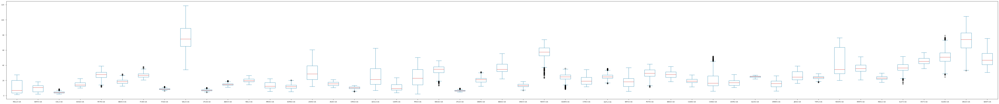

In [ ]:
fig, ax = plt.subplots()
data.plot(kind='box', ax=ax, figsize=(100,10))
fig.show()

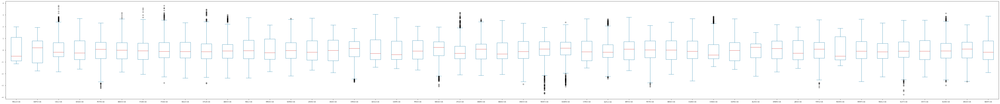

In [ ]:
data_scaled = StandardScaler().fit_transform(data)
data_scaled = pd.DataFrame(data_scaled, columns=data.columns, index=data.index)
fig, ax = plt.subplots()
data_scaled.plot(kind='box', ax=ax, figsize=(100,10))
fig.show()

###4. Realize o pré-processamento adequado dos dados. Descreva os passos necessários.

#### R: Devido ao período histórico estipulado, haverá empresas que constam o valor "nan" pois não existiam na determinada data. Para isso, irei realizar o pré-procesamento dos dados substituindo os números "nan" por "0".


In [ ]:
data_scaled.isnull().sum().sum()

1829

In [ ]:
data_scaled = data_scaled.fillna(0)
data_scaled.head().isnull().sum().sum()

0

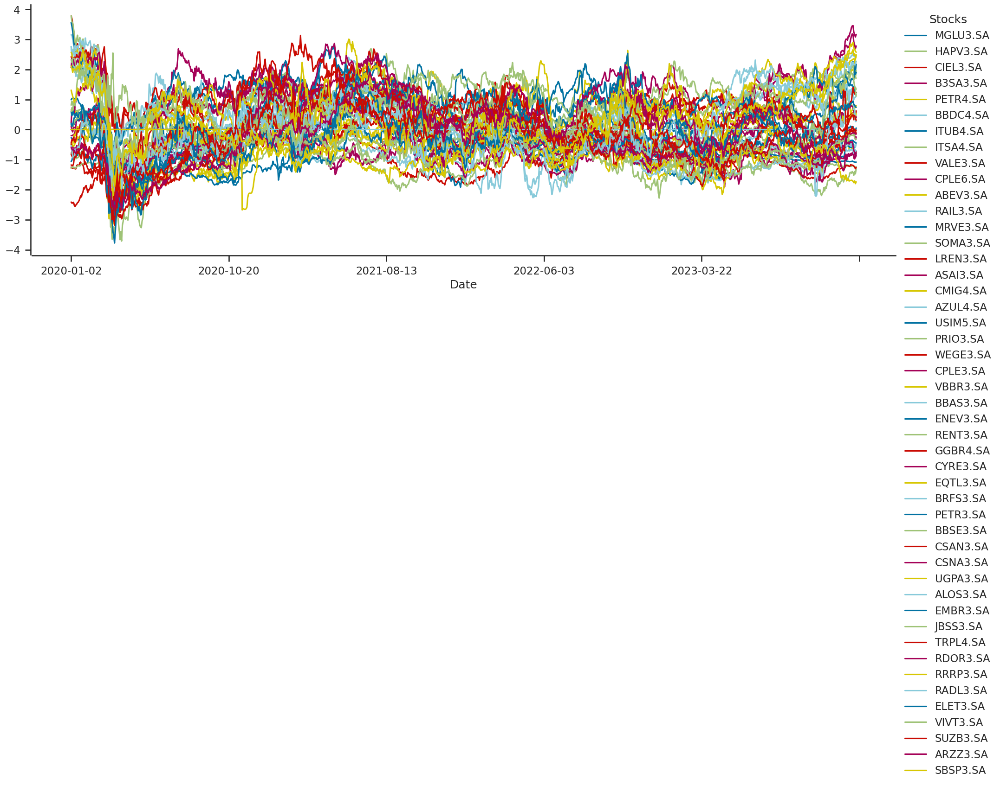

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

sns.set_style('ticks')
sns.set_context('talk')
fig, ax = plt.subplots(figsize=(24, 7))
data_scaled.plot(ax=ax)
plt.legend(title='Stocks',loc=2, bbox_to_anchor=(1, 1))
sns.despine(offset=2, right=True)


#Clusterização

### Irei utilizar dois tipos de Clusterização:


*   Clusterização Hierárquica
*   DBSCAN



##### Irei realizar uma matrix de correlação com os dados para saber a proximidade de semelhança entre eles.

##### Como medida de distância irei subtratir os valores da matriz de correlação por 1 para saber, em valor, a distância dos pontos.

##### Isso fornecerá, em expressão numéria, o quão próximo o dado é em relação aos outros dados.

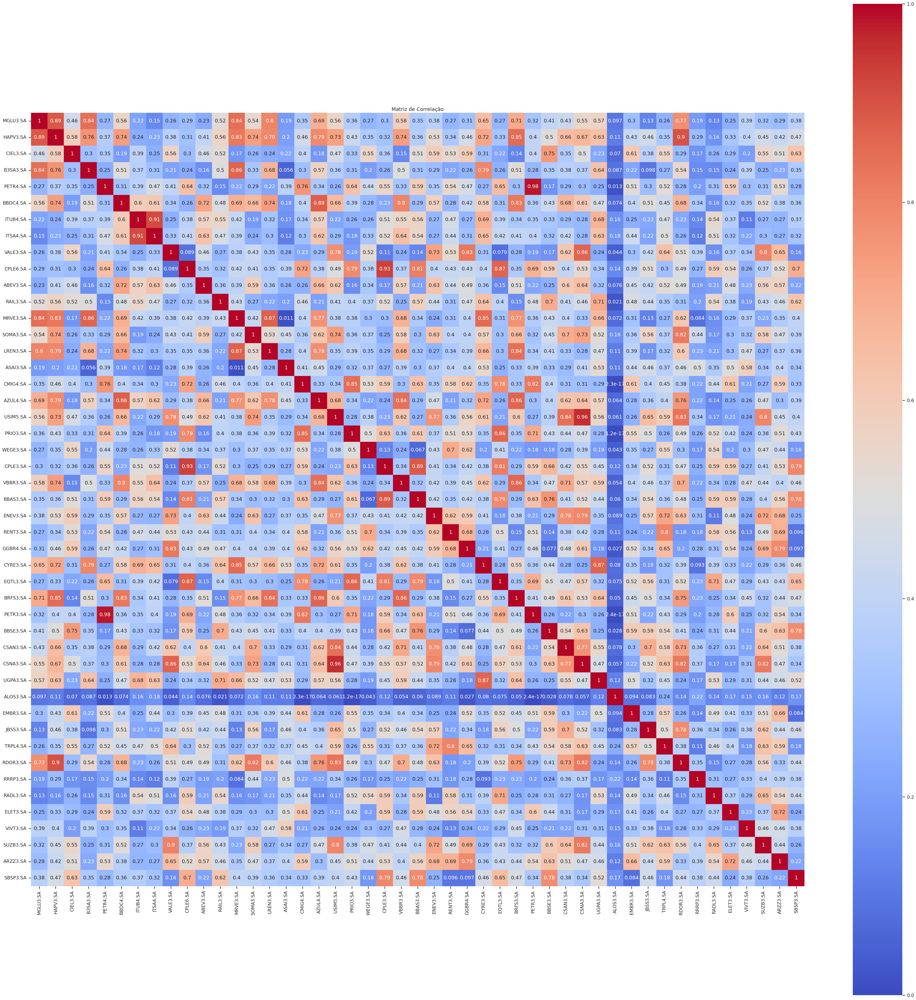

In [ ]:
from statsmodels.tsa.stattools import ccf

ccf_matrix = pd.DataFrame(
    np.zeros([data.shape[1], data.shape[1]]),
    columns=data.columns,
    index=data.columns
)

for col in ccf_matrix.columns:
    for idx in ccf_matrix.index:
        result = ccf(data_scaled[idx], data_scaled[col], adjusted=False)
        ccf_matrix.loc[idx, col] = max(result)
        ccf_matrix.loc[col,idx] = max(result)

plt.subplots(figsize=(50,50))
sns.heatmap(ccf_matrix,
            xticklabels=ccf_matrix.columns,
            yticklabels=ccf_matrix.columns,
            cmap="coolwarm",
            square=True, annot=True)
plt.title('Matriz de Correlação')
plt.tight_layout()
plt.show()


##### Como medida de distância irei subtratir os valores da matriz de correlação por 1 para saber a distância dos pontos.
##### Isso fornecerá, em expressão numéria, o quão próximo o dado é em relação aos outros dados.


/usr/local/lib/python3.10/dist-packages/seaborn/matrix.py:530: ClusterWarning:

scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix



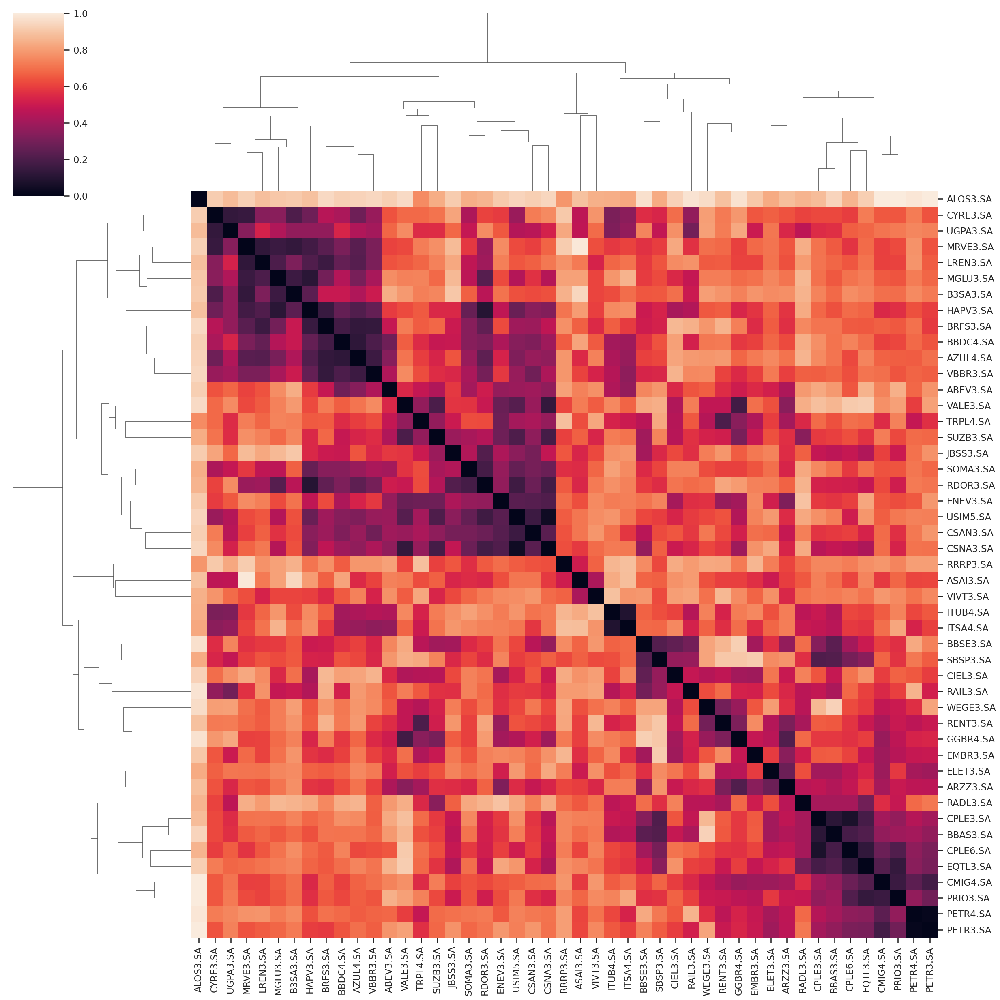

In [ ]:
distances = pd.DataFrame(1 - ccf_matrix)

tolerance = 1e-10
distances = np.where(np.abs(distances) < tolerance, 0, distances)
distances = pd.DataFrame(distances, index=ccf_matrix.index, columns=ccf_matrix.columns)

sns.clustermap(distances, figsize=(25, 25))

#### Funções

In [ ]:
import ipywidgets as widgets
from ipywidgets import interact, fixed, Layout
import matplotlib.pyplot as plt
import seaborn as sns

def get_conex(X, data_scaled, input):
    colunas_cluster = input.loc[input['Cluster'] == X, 'Stock']
    ent_mat = pd.DataFrame(index=colunas_cluster, columns=colunas_cluster).fillna(0.0)

    for col1 in ent_mat.columns:
        for col2 in ent_mat.index:
            result = ccf(data_scaled[col1], data_scaled[col2], adjusted=False)
            ent_mat.loc[col2, col1] = max(result)
            ent_mat.loc[col1, col2] = max(result)

    plt.subplots(figsize=(10, 10))
    sns.heatmap(ent_mat,
                xticklabels=ent_mat.columns,
                yticklabels=ent_mat.columns,
                cmap="coolwarm", vmin=0, vmax=1,
                square=True, annot=True)
    plt.title(f'Matriz de Correlação do cluster {X}')
    plt.tight_layout()
    plt.show()

In [ ]:
def grafic(X):
  sns.set_context('paper')
  for clust in np.unique(X):
      ax = axes[clust - 1]
      cols = np.where(X == clust)[0]
      data_scaled[data.columns[cols]].plot(ax=ax)
      sep_cluster_h.append(data.columns[cols])
      legend = ax.legend()
      legend.remove()
      ax.set_title(f'{" | ".join(data.columns[cols])}')
      ax.legend(title=f'Stocks of Cluster {clust}',loc=2, bbox_to_anchor=(1, 1))

  fig.tight_layout()

## Clusterização Hierarquica

### Irei produzir um dendograma para ver as semelhanças de cada cluster. O parâmetro de corte é baseado na melhor separação dos clusters ou o que parecer mais adequado.


In [ ]:
import scipy.cluster.hierarchy as sch
from scipy.cluster.hierarchy import dendrogram, linkage, fcluster
from sklearn.cluster import AgglomerativeClustering


<ipython-input-427-c0649564ad89>:6: ClusterWarning:

scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix



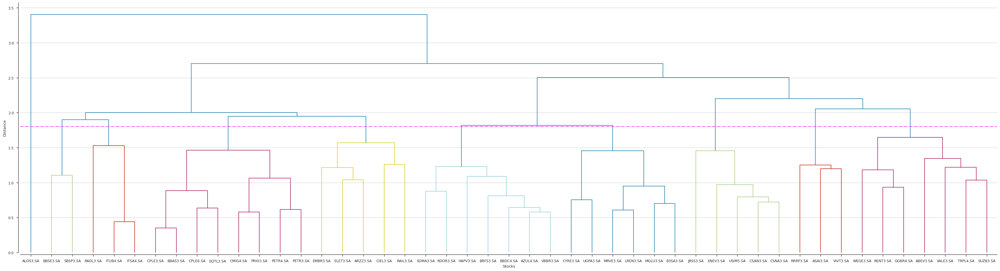

In [ ]:
distance_threshold = 1.8

sns.set_context('paper')
fig, ax = plt.subplots(figsize=(35, 10))
sns.set_style('ticks')
linkage_matrix = linkage(distances, method='complete')
dend = dendrogram(linkage_matrix, color_threshold=distance_threshold,
                      get_leaves=True)

ax.set_xticklabels(data.columns[dend['leaves']]);
ax.axhline(distance_threshold, c='magenta', ls="dashdot")
ax.set_xlabel("Stocks")
ax.set_ylabel("Distance")
ax.yaxis.grid(True)


fig.tight_layout()
sns.despine(offset=5)

In [ ]:
output_rows = []
input = pd.DataFrame(data.columns)
for index, (leave, cluster) in enumerate(zip(dend['leaves'], dend['leaves_color_list'])):
    output_row = {
        'Stock' : data.columns[leave],
        'Leave': leave,
        'Cluster': cluster,
        'Means': data_scaled[data.columns[leave]].mean()
    }
    output_rows.append(output_row)

output_df = pd.DataFrame(output_rows)

cluster_counts = output_df['Cluster'].value_counts()
cluster_counts

C3    8
C5    7
C9    7
C6    6
C4    5
C7    5
C2    3
C8    3
C1    2
C0    1
Name: Cluster, dtype: int64

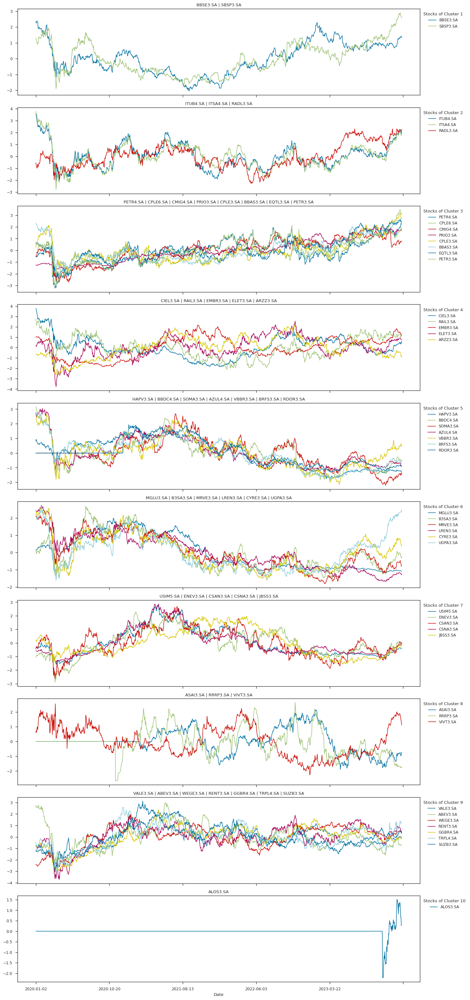

In [ ]:
ch_cluster = fcluster(linkage_matrix, len(cluster_counts), criterion='maxclust')

sep_cluster_h = []

fig, axes = plt.subplots(max((ch_cluster)), 1, figsize=(15, 32), sharex=True)

grafic(X=ch_cluster)

In [ ]:
clusters_unicos = output_df['Cluster'].unique()
layout = Layout(display='flex', flex_flow='row', align_items='center')
slider = widgets.Dropdown(options=clusters_unicos, description='Cluster', layout=layout)
interact(get_conex, X=slider, data_scaled=fixed(data_scaled), input=fixed(output_df))

interactive(children=(Dropdown(description='Cluster', layout=Layout(align_items='center', display='flex', flex…

<function __main__.get_conex(X, data_scaled, input)>

## Considerações finais:

### A determinação do melhor ponto de corte para definir os grupos revelou-se eficaz na região de 1.52, proporcionando uma boa segmentação para as ações.

### Ademais, podemos verificar que a maioria dos clusters há uma tendência a serem seguidas, mesmo que sejam de maiores oscilações.

1. **Cluster 1:** grupo de 2 ações. O cluster obteve bons resultados ao juntar empresas que possuem uma faixa temporal aproximada.

2. **Cluster 2:** grupo de 3 ações. O cluster obteve resultados razoáveis ao juntar empresas que possuem uma faixa de aproximoximação significativa entre si. Aparentemente, a ação RADL3.SA não parece estar alocada no cluster.

3. **Cluster 3:** grupo de 8 ações. O cluster obteve bons resultados ao juntar empresas que possuem uma faixa de semlhança significativa entre si. Pode-se dizer que houve uma junção de empresas que obtiveram um bom crescimento apó a COVID-19.

4. **Cluster 4:** grupo de 5 ações. O cluster não obteve bons resultados ao juntar empresas com oscilações semelhantes entre si. As ações, EMBR3.SA, ELET.SA, e ARZZ3.SA não parecem estar bem alocadas.

5. **Cluster 5:** grupo de 7 ações. O cluster obteve bons resultados ao juntar empresas que possuem uma faixa temporal aproximada.

6. **Cluster 6:** grupo de 6 ações. O cluster obteve bons resultados ao juntar empresas que possuem uma faixa temporal aproximada. Porém, a ação LREN3.SA não parece ter uma boa relação com a UGPA3.SA alocada no cluster.

7. **Cluster 7:** grupo de 5 ações. O cluster obteve resultados razoáveis ao juntar empresas que possuem uma faixa de semlhança significativa entre si.

8. **Cluster 8:** grupo de 3 ações. O cluster não obteve bons resultados ao juntar empresas que possuem uma faixa de semlhança significativa entre si.


9. **Cluster 9:** grupo de 7 ações. O cluster obteve resultados razoaveis ao juntar empresas que possuem uma faixa de semlhança significativa entre si. Porém, a ação ABEV3.SA não parece estar bem alocada.

10. **Cluster 10 (C0):** a ação ALOS3.SA foi considerada um outlier por ser recente na B3.

## DBSCAN
#### Agora, iremos aplicar com o DBScan (Density-Based Spatial Clustering of Applications with Noise). A principal característica dessa técnica é a identifcação de regiões onde concentram grandes densidades de pontos, atribuindo a elas clusters, enquanto pontos isolados são considerados ruído.

#### Passaremos, como entrada, as distâncias obtidas na subtração com a matriz de correlação.

In [ ]:
from sklearn.pipeline import make_pipeline
from sklearn.cluster import DBSCAN

 #### O DBScan é guiado pelos parâmetros de raio (eps) e número mínimo de pontos (min_samples). Esses parâmetros determinam a densidade mínima necessária para formar um cluster. Em vez de usar a silhueta, a escolha adequada de eps e minPts é geralmente realizada por meio de testes.

 #### Escolhemos
 * o eps= 1.03 pois a distribuição se saiu melhor do que as demais; e
 * o min_samples = 2 para que vejamos as semelhanças temporais em, no mínimo, duas ações.

In [ ]:
dbscan_cluster = pd.DataFrame(data.columns.T)
gap_enc = pd.DataFrame(distances, columns=data.columns)
dbscan = DBSCAN(eps=1.03, min_samples=2)
dbscan_cluster['Cluster'] = dbscan.fit_predict(gap_enc)
lenth = dbscan_cluster.Cluster.value_counts().sort_index()

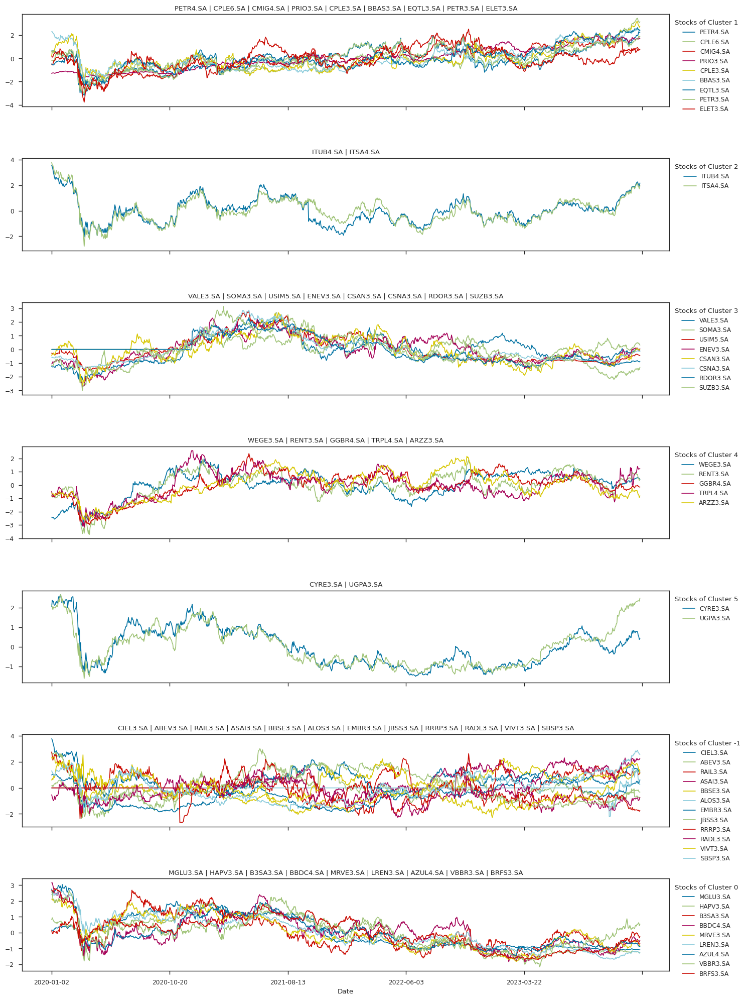

In [ ]:
fig, axes = plt.subplots(len(lenth), 1, figsize=(15, 20), sharex=True)

grafic(X=dbscan_cluster['Cluster'])

#### Outliers encontrados

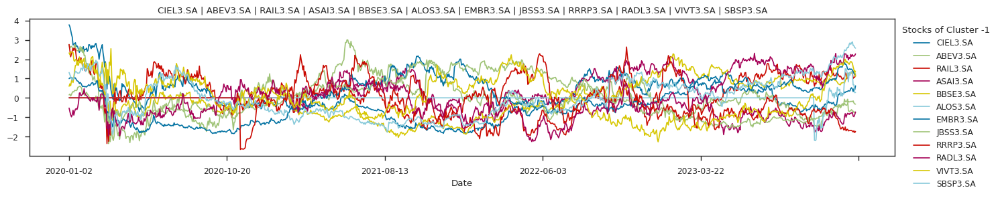

In [ ]:
fig, axes = plt.subplots(1, 1, figsize=(15,3), sharex=True)

for clust in dbscan_cluster['Cluster']:
  if clust == -1:
    cols = np.where(dbscan_cluster['Cluster']== clust)[0]
    data_scaled[data.columns[cols]].plot(ax=axes)
    axes.set_title(f'{" | ".join(data.columns[cols])}')
    axes.legend(title=f'Stocks of Cluster {clust}',loc=2, bbox_to_anchor=(1, 1))
    break

fig.tight_layout()
plt.show()

In [ ]:
dbscan_cluster = dbscan_cluster.rename(columns={0: 'Stock'})

In [ ]:
clusters_dbscan = dbscan_cluster['Cluster'].unique()

layout = Layout(display='flex', flex_flow='row', align_items='center')

slider = widgets.Dropdown(options=clusters_dbscan, description='Cluster', layout=layout)

interact(get_conex, X=slider, data_scaled=fixed(data_scaled), input=fixed(dbscan_cluster))

interactive(children=(Dropdown(description='Cluster', layout=Layout(align_items='center', display='flex', flex…

<function __main__.get_conex(X, data_scaled, input)>

## Considerações finais:

1. **Cluster -1:** grupo de 12 ações. Classificam-se como outliers encontrados.

2. **Cluster 0:** grupo de 9 ações. O cluster obteve bons resultados ao juntar empresas que possuem uma faixa temporal aproximada.

3. **Cluster 1:** grupo de 9 ações. O cluster obteve resultados bons ao juntar empresas que possuem uma faixa temporal aproximada, semelhante ao da Clusterização Hierárquica. A ação ELET3.SA não parece estar bem alocada.

4. **Cluster 2:** grupo de 2 ações. O cluster obteve ótimos resultados ao juntar empresas que possuem uma faixa temporal aproximada, semelhante aos da Clusterização Hierárquica.

5. **Cluster 3:** grupo de 8 ações. O cluster obteve resultados razoáveis ao juntar empresas que possuem uma faixa temporal aproximada.

6. **Cluster 4:** grupo de 5 ações. O cluster obteve resultados razoáveis ao juntar empresas que possuem uma faixa temporal aproximada.

7. **Cluster 5:** grupo de 2 ações. O cluster obteve ótimos resultados ao juntar empresas que possuem uma faixa temporal aproximada.

#### Os clusteres da Clusterização Hierárquica e do DBSCAN se assemelham em algumas partes. Ambas obtiveram características únicas e bem precisas, como Clusters 2 e 5 do DBSCAN e 1, 2 e 5 da Clusterização Hierárquica.


## **Silhueta**

#### A técnica de silhueta é utilizada para saber se os clusters estão bem separados uns dos outros. Caso apareça um valor negativo no gráfico, significa que aquele ponto não está bem alocado naquele cluster.

####  O índice Silhueta valida o desempenho do cluster com base apenas na diferença entre pares de distâncias entre e dentro do cluster de todos os pontos de dados.


#### Porém, não é uma boa escolha para lidar com análises temporais, pois não há uma linearidade entre os pontos.

#### A medida de silhueta também não é uma aplicação adequada para o DBScan (Density-Based Spatial Clustering of Applications with Noise), pois o DBScan  produz agrupamentos baseados em densidade, o que não é eficaz para pontos muito próximos.

In [ ]:
!pip install yellowbrick 2>&1 > /dev/null

from sklearn.cluster import KMeans
from yellowbrick.cluster import KElbowVisualizer
from sklearn import metrics
from yellowbrick.cluster import SilhouetteVisualizer

model = 100
silhouette_avgs = []
min_k = 2
max_k = 10

X = ccf_matrix.copy()

Silhouette Coefficients for k = 2 is 0.22842693447978502
Silhouette Coefficients for k = 3 is 0.22304677698671485
Silhouette Coefficients for k = 4 is 0.25743004487094795
Silhouette Coefficients for k = 5 is 0.23457819717970424
Silhouette Coefficients for k = 6 is 0.23653314794481395
Silhouette Coefficients for k = 7 is 0.2180825666417242
Silhouette Coefficients for k = 8 is 0.24662954714390206
Silhouette Coefficients for k = 9 is 0.20653628808594263
Optimal K is  4


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



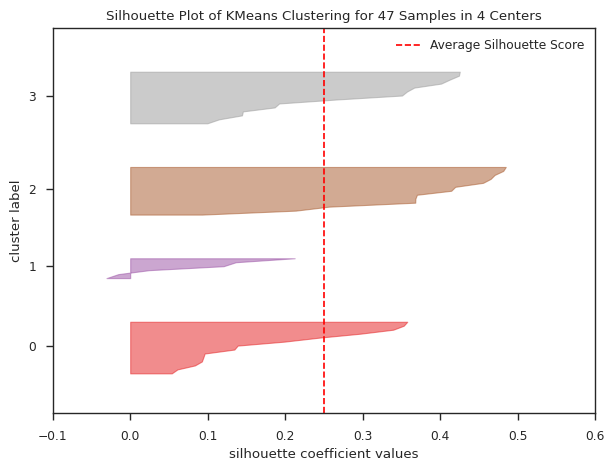

<Axes: title={'center': 'Silhouette Plot of KMeans Clustering for 47 Samples in 4 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>

In [ ]:
for k in range(min_k, max_k):
    kmeans = KMeans(n_clusters=k, n_init=model, random_state=0).fit(X)
    score = metrics.silhouette_score(X, kmeans.labels_)
    label = kmeans.predict(X)
    print("Silhouette Coefficients for k =", k, "is", score)
    silhouette_avgs.append(score)

f, ax = plt.subplots(figsize=(7, 5))
ax.plot(range(min_k, max_k), silhouette_avgs)

plt.xlabel("Número de Clusters")
plt.ylabel("Silhouette Coefficients")

opt_1 = silhouette_avgs.index(max(silhouette_avgs)) + min_k
print("Optimal K is ", opt_1)

optimal_k = KMeans(n_clusters=opt_1, random_state=42)
model_k = SilhouetteVisualizer(optimal_k)
model_k.fit(X)
model_k.show()

##### A silhueta nos mostra que há dados que não estão bem alocados no cluster 1.

### Escolha mais duas medidas de validação para comparar com o índice de silhueta e analise os resultados encontrados. Observe, para a escolha, medidas adequadas aos algoritmos.

##### O método Elbow e a Visualização da silhueta são técnicas que ajudam a escolher um número ideal de clusters em algoritmos de agrupamento. Com eles eu posso comparar os índices de silhueta e o cluster.

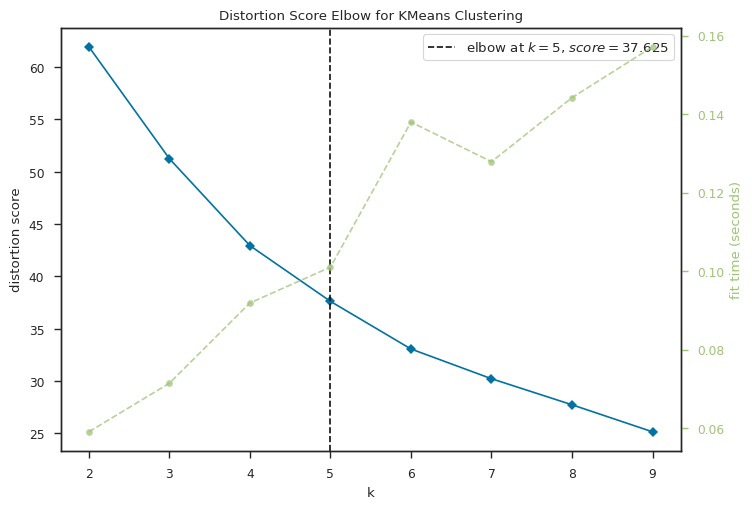

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [ ]:
visual = KMeans(n_init=model)
visual = KElbowVisualizer(visual, k=(2, 10))
visual.fit(X)

visual.show()

(0.1, 0.8)

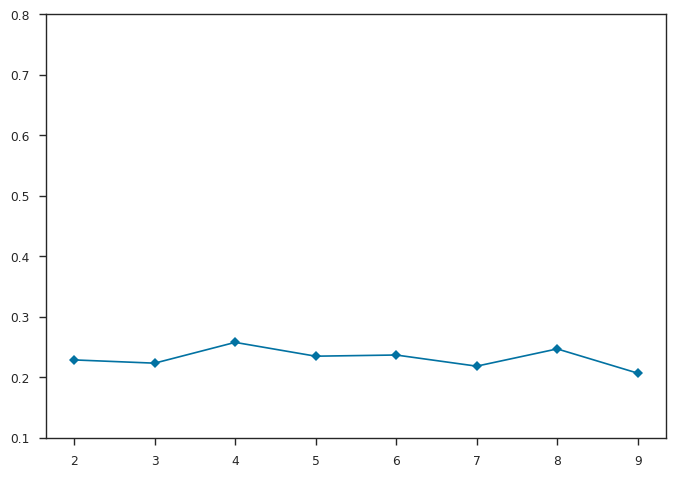

In [ ]:
fig, ax = plt.subplots()
visual_2 = KElbowVisualizer(kmeans, k=(2, 10), metric='silhouette', locate_elbow=False, timings=False, ax=ax)
visual_2.fit(X)
ax.set_ylim([.1, .8])


In [ ]:
k = opt_1
kmeans = KMeans(n_clusters=k,n_init=model, random_state=0)
kmeans = kmeans.fit(X)
labels = kmeans.predict(X)
centroids = kmeans.cluster_centers_

results_silhouet = pd.DataFrame(data_scaled.columns)
results_silhouet['Cluster']  = labels
results_silhouet.Cluster.value_counts().sort_index()

0    13
1    16
2     4
3    14
Name: Cluster, dtype: int64

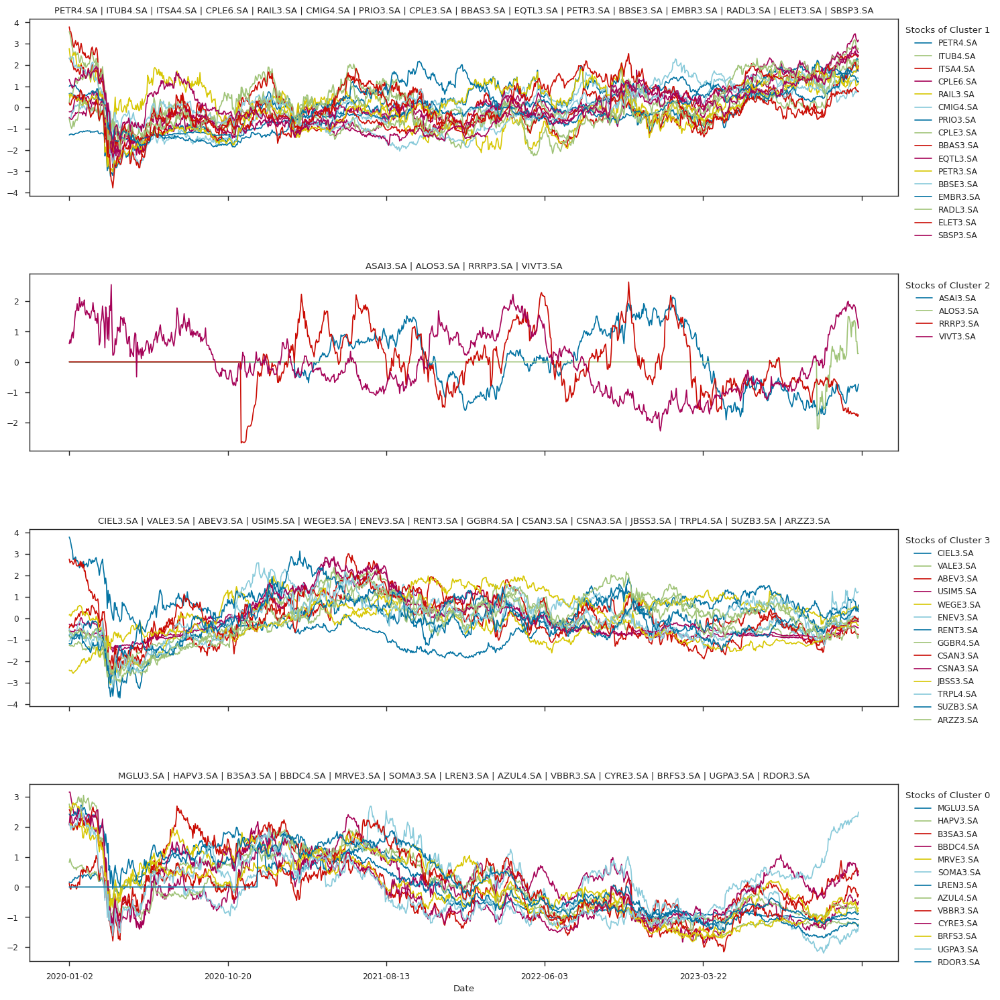

In [ ]:
fig, axes = plt.subplots(opt_1, 1, figsize=(15, 15), sharex=True)

grafic(X=results_silhouet['Cluster'])

### Um determinado problema, apresenta 10 séries temporais distintas. Gostaríamos de agrupá-las em 3 grupos, de acordo com um critério de similaridade, baseado no valor máximo de correlação cruzada entre elas. Descreva em tópicos todos os passos necessários.

#### Para o problema da questão anterior, indique qual algoritmo de clusterização você usaria. Justifique.

##### R: A Análise de Componentes Pricipais é uma ótima análise para redução de dimensionalidade, retendo apenas alguns dos componentes principais para o uso.Ela gira o conjunto de dados de forma que os recursos girados não sejam estatisticamente correlacionados.

##### Abaixo, realizei uma demonstração com os dados de ações obtidas anteriormente.

#### K-Means com PCA

In [ ]:
!pip install rogeriopradoj-paretochart 2>&1 > /dev/null

from sklearn.decomposition import PCA
import plotly.express as px

pca = PCA(n_components=len(ccf_matrix.columns))
data_pca = pca.fit_transform(ccf_matrix)
exp_var_cumul = np.cumsum(pca.explained_variance_ratio_)

px.area(
    x=range(1, exp_var_cumul.shape[0] + 1),
    y=exp_var_cumul,
    labels={"x": "# Componentes", "y": "Variância"}
)


#### Conforme o gráfico acima, com 6 componentes obtemos 83% de variância.

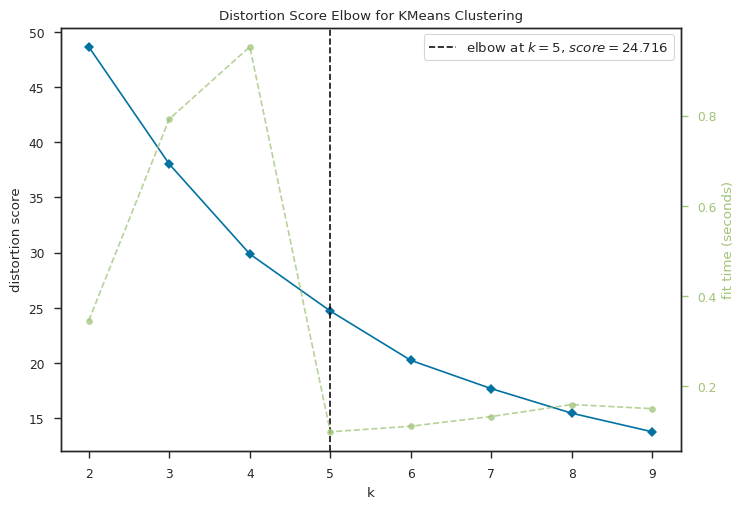

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [ ]:
pca = PCA(n_components=6)
data_pca = pca.fit_transform(ccf_matrix)

kmeans_pca = KMeans(n_init=model)
visual_pca = KElbowVisualizer(kmeans_pca, k=(2, 10))
visual_pca.fit(data_pca)
visual_pca.show()

Silhouette Coefficients for k = 2 is 0.2822495845172452
Silhouette Coefficients for k = 3 is 0.281371362126288
Silhouette Coefficients for k = 4 is 0.3294172977887599
Silhouette Coefficients for k = 5 is 0.3099749547216225
Silhouette Coefficients for k = 6 is 0.3232498547143254
Silhouette Coefficients for k = 7 is 0.312096994423113
Silhouette Coefficients for k = 8 is 0.30332540174972084
Silhouette Coefficients for k = 9 is 0.3248730948038813
Optimal K is  4


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



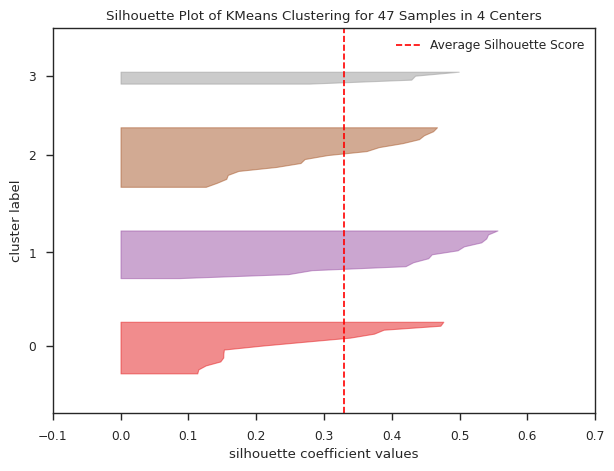

<Axes: title={'center': 'Silhouette Plot of KMeans Clustering for 47 Samples in 4 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>

In [ ]:
silhouette_avgs = []
min_k = 2
max_k = 10

X = data_pca

for k in range(min_k, max_k):
    kmeans_pca = KMeans(n_clusters=k, n_init=model, random_state=0).fit(X)
    score = metrics.silhouette_score(X, kmeans_pca.labels_)

    print("Silhouette Coefficients for k =", k, "is", score)
    silhouette_avgs.append(score)

f, ax = plt.subplots(figsize=(7, 5))
ax.plot(range(min_k, max_k), silhouette_avgs)

plt.xlabel("Number of clusters")
plt.ylabel("Silhouette Coefficients")

opt_2 = silhouette_avgs.index(max(silhouette_avgs)) + min_k
print("Optimal K is ", opt_2)

optimal_pca = KMeans(n_clusters=opt_2, random_state=42)
model_k = SilhouetteVisualizer(optimal_pca)
model_k.fit(X)
model_k.show()

(0.1, 0.8)

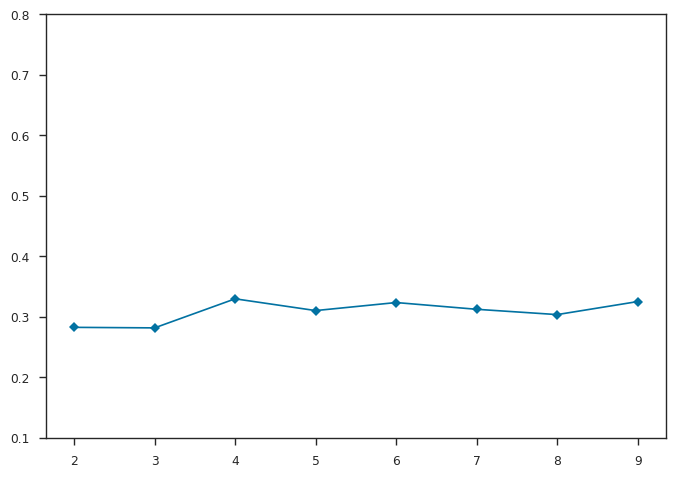

In [ ]:
fig, ax = plt.subplots()
visual_2 = KElbowVisualizer(kmeans_pca, k=(2, 10), metric='silhouette', locate_elbow=False, timings=False, ax=ax)
visual_2.fit(X)
ax.set_ylim([.1, .8])

In [ ]:
k = opt_2

kmeans = KMeans(n_clusters=k,n_init=model, random_state=0)
kmeans = kmeans.fit(X)
labels = kmeans.predict(X)
centroids = kmeans.cluster_centers_

results_pca = pd.DataFrame(data.columns)
results_pca['Cluster']  = labels
results_pca.Cluster.value_counts().sort_index()

0    14
1    16
2     4
3    13
Name: Cluster, dtype: int64

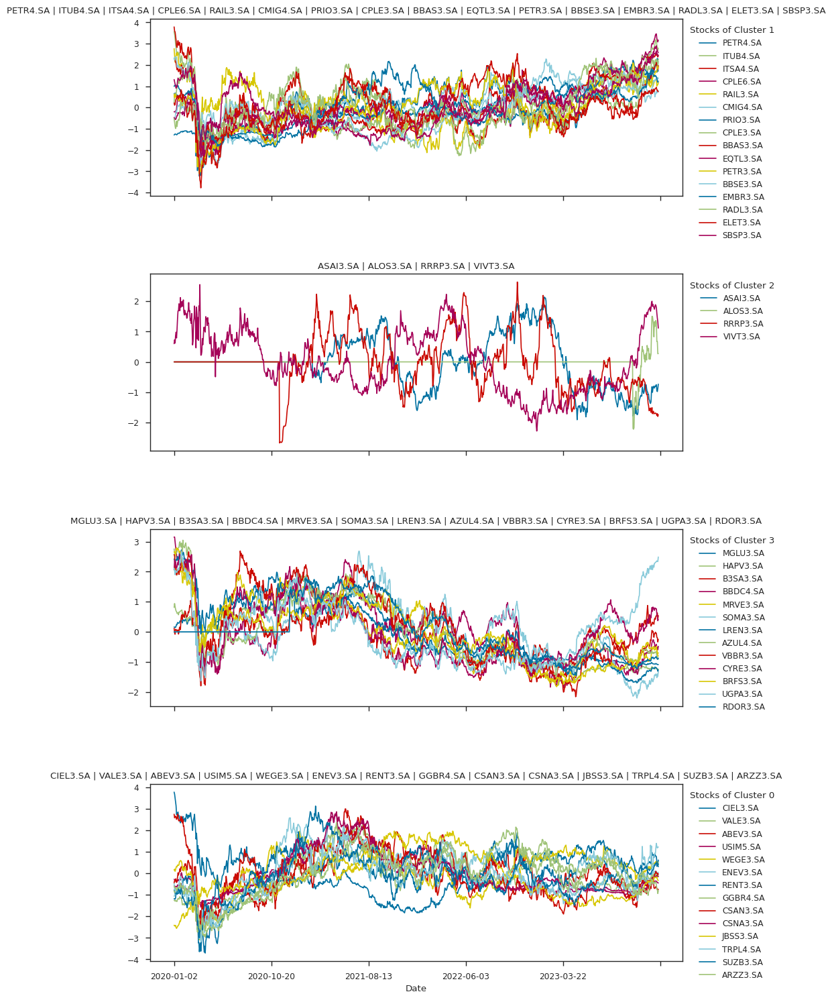

In [ ]:
fig, axes = plt.subplots(opt_2, 1, figsize=(10, 15), sharex=True)

grafic(X=results_pca['Cluster'])

#### Após realizar a técnica de silhueta e utilizar o cotovelo foi possível encontrar o melhor número de cluster apra K-Meas.

#### Ambas obtiveram o mesmo resultado, porém, a análise PCA obteve uma melhora na silhueta de 0.257 para 0.329.

#### Com o PCA o problema do Cluster 1 encontrado na primeira análise K-Mens foi resolvido .

#### Os Clusters 1 de ambas as análises do KMeans agruparam ações que com um bom desempenho após o Covid-19.

### Sugira outra estratégia para medir a similaridade entre séries temporais. Descreva em tópicos os passos necessários:
#### R: Outro modo de medir a similaridade entre séries temporais é obtendo a distância entre elas como demonstramos acima.

#### A utilização do algoritmo de K-Means não é uma boa escolha pois ele utiliza a distância euclidiana que trata cada dado como um dado independente dos demais. A ordem dos pontos é crucial para capturar a estrutura temporal e por isso precisamos dessa continuidade. A distância euclidiana não leva em consideração a dependência temporal entre os pontos.

#### Os clusters não oferecem um bom agrupamento de semelhança como obtido na Clusterização Hierarquica e no DBSCAN.


## Considerações finais (K-Means):

#### A utilização do algoritmo de K-Means mesmo com o PCA não é uma boa escolha para análise temporal pois ele utiliza a distância euclidiana.

#### Os clusters não oferecem um agrupamento mais especificado das ações como obtido na Clusterização Hierarquica ou DBSCAN.

Link para o notebook: https://colab.research.google.com/drive/14Pkyu52GDLNJx30bQ6LGkcdaiGTBnuow?usp=sharing